In [1]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import cm
from multiprocessing import Pool
import seaborn as sns
import pandas as pd
import pickle
import seaborn as sns
from statannot import add_stat_annotation
from torch.utils.tensorboard import SummaryWriter
from tqdm import tqdm
import torch

from ga.utils import run, plot_agent
from ga.seirs_wrapper import SEIRSWrapper
from ga.agents import DummyAgent
from ga.utils import tmp_run, get_lockdowns, get_curve_stats
from ga.seirs_parameters import SEIRSParams

### Loading the population and run the population to get their scores

In [2]:
params = {
    'legend.fontsize': 'xx-large',
    'figure.figsize': (10, 10),
    'axes.labelsize': 'xx-large',
    'axes.titlesize': 'xx-large',
    'xtick.labelsize': 'xx-large',
    'ytick.labelsize': 'xx-large'
}
plt.rcParams.update(params)
params = SEIRSParams('config/default_config.ini')

/Users/javier/Desktop/Corona-Research/seirsplus/seirsplus/models.py:402: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(['{:,.0%}'.format(y) for y in ax.get_yticks()])
/Users/javier/Desktop/Corona-Research/seirsplus/seirsplus/models.py:402: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(['{:,.0%}'.format(y) for y in ax.get_yticks()])
/Users/javier/Desktop/Corona-Research/seirsplus/seirsplus/models.py:402: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(['{:,.0%}'.format(y) for y in ax.get_yticks()])
/Users/javier/Desktop/Corona-Research/seirsplus/seirsplus/models.py:402: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(['{:,.0%}'.format(y) for y in ax.get_yticks()])
/Users/javier/Desktop/Corona-Research/seirsplus/seirsplus/models.py:402: UserWarning: FixedFormatter should only be used together wi

/Users/javier/Desktop/Corona-Research/seirsplus/seirsplus/models.py:402: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(['{:,.0%}'.format(y) for y in ax.get_yticks()])
/Users/javier/Desktop/Corona-Research/seirsplus/seirsplus/models.py:402: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(['{:,.0%}'.format(y) for y in ax.get_yticks()])
/Users/javier/Desktop/Corona-Research/seirsplus/seirsplus/models.py:402: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(['{:,.0%}'.format(y) for y in ax.get_yticks()])
/Users/javier/Desktop/Corona-Research/seirsplus/seirsplus/models.py:402: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(['{:,.0%}'.format(y) for y in ax.get_yticks()])
/Users/javier/Desktop/Corona-Research/seirsplus/seirsplus/models.py:402: UserWarning: FixedFormatter should only be used together wi

/Users/javier/Desktop/Corona-Research/seirsplus/seirsplus/models.py:402: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(['{:,.0%}'.format(y) for y in ax.get_yticks()])
/Users/javier/Desktop/Corona-Research/seirsplus/seirsplus/models.py:402: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(['{:,.0%}'.format(y) for y in ax.get_yticks()])
/Users/javier/Desktop/Corona-Research/seirsplus/seirsplus/models.py:402: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(['{:,.0%}'.format(y) for y in ax.get_yticks()])
/Users/javier/Desktop/Corona-Research/seirsplus/seirsplus/models.py:402: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(['{:,.0%}'.format(y) for y in ax.get_yticks()])
/Users/javier/Desktop/Corona-Research/seirsplus/seirsplus/models.py:402: UserWarning: FixedFormatter should only be used together wi

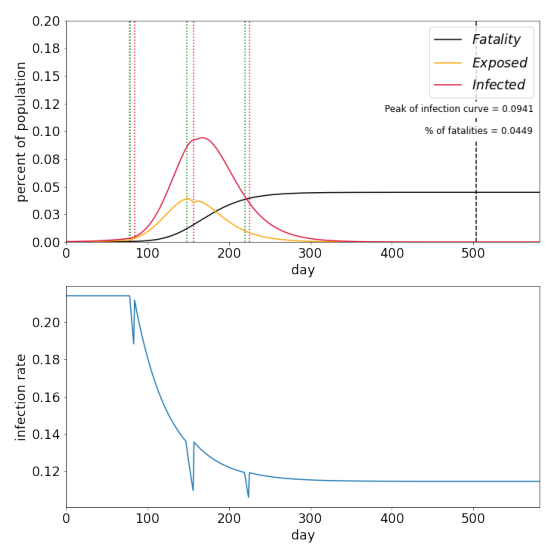

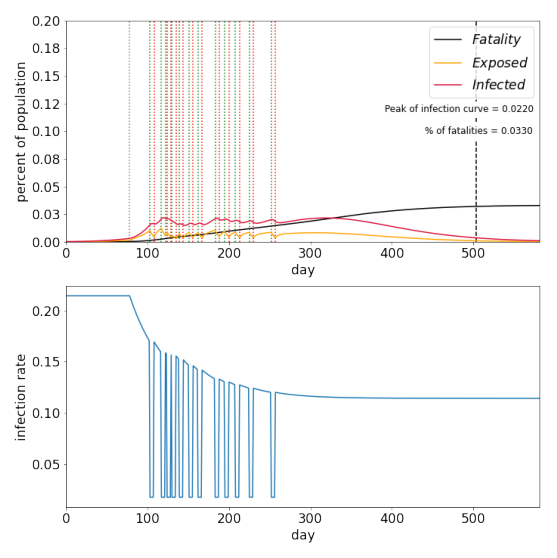

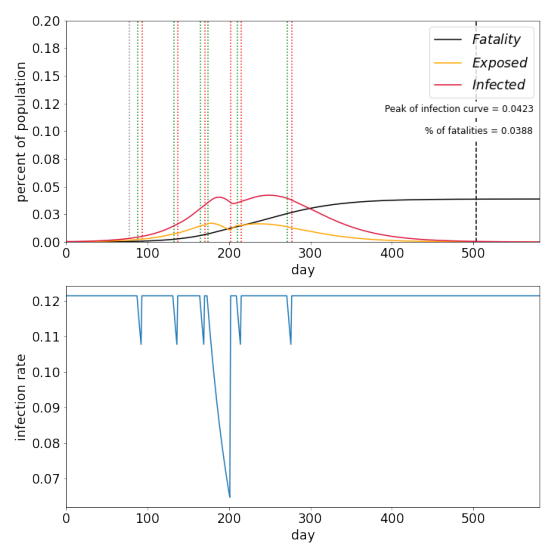

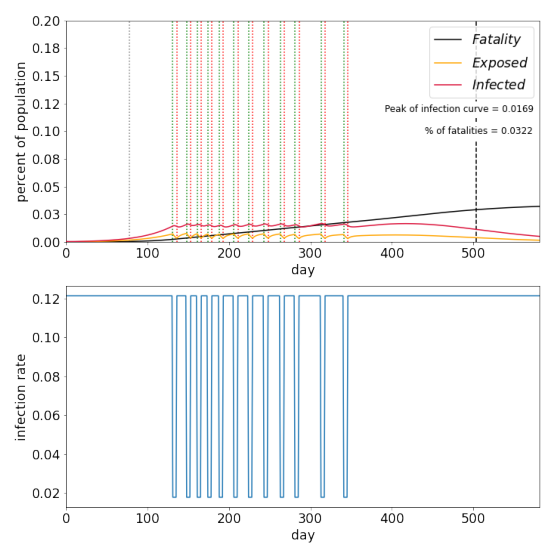

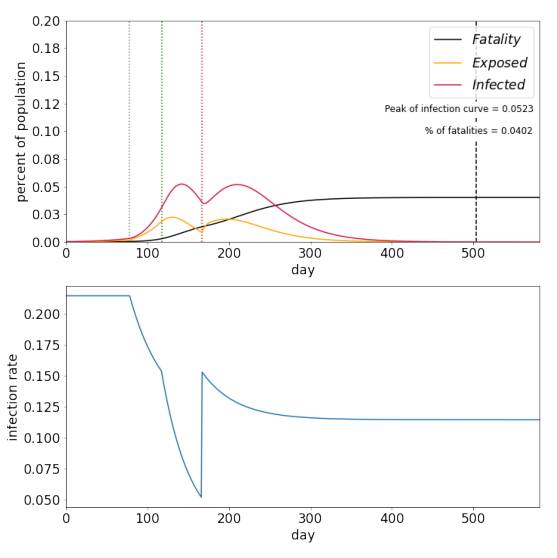

...

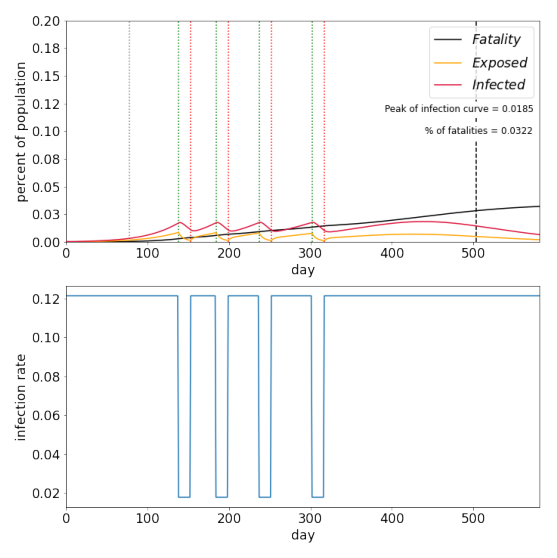

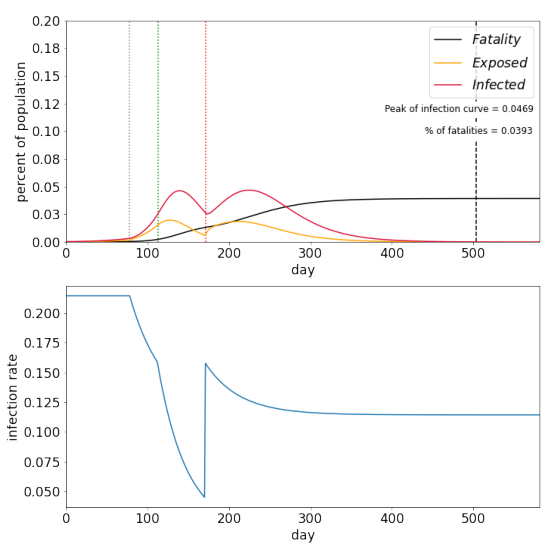

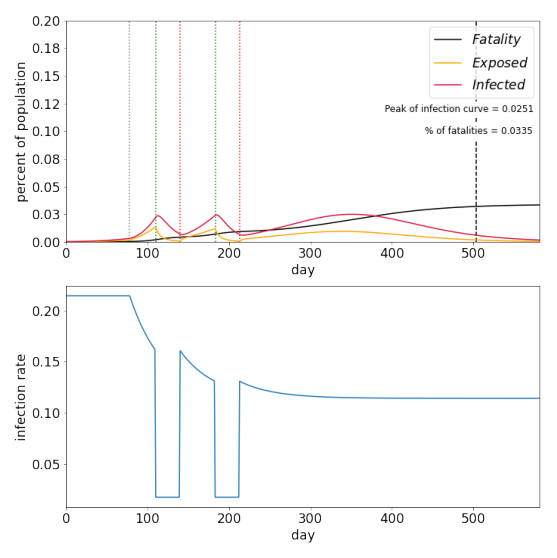

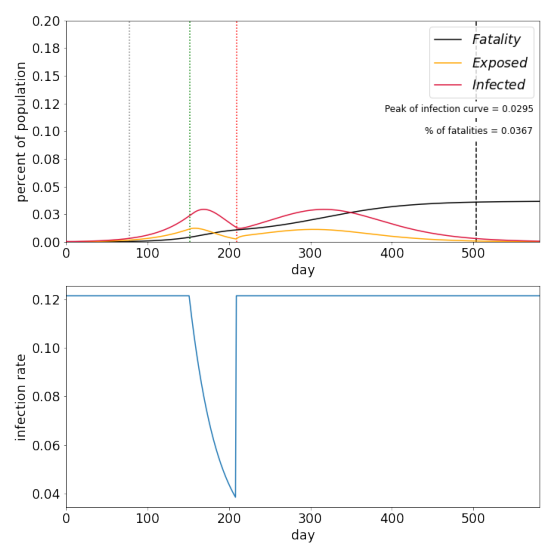

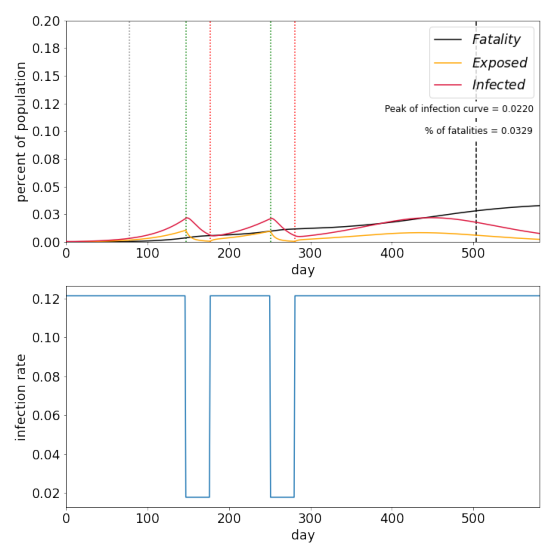

In [8]:
runs_s = [0, 1, 2, 3, 4]
quarantine_length_s = [5, 10, 15, 30]
types_quarantine_s = ['Decay_Decay', 'Decay_Off', 'On_Decay', 'On_Off']

for runs in runs_s:
    for quarantine_length in quarantine_length_s:
        for types_quarantine in types_quarantine_s:
            params.decay_type = types_quarantine
            population = pickle.load(open(f"ga_runs_final/run_{runs}/qurantine_block_{quarantine_length}_final_run_{types_quarantine}/epoc_390.p", "rb"))
            img = plot_agent(population[0], params)
            plt.figure()
            plt.imshow(img.transpose(1, 2, 0))
            plt.axis('off')
            plt.savefig(f'fig/{types_quarantine}_{quarantine_length}days_run{runs}')

### Plotting

#### The plot below displays the best solution

In [4]:
params = SEIRSParams('config/default_config.ini')

/Users/javier/Desktop/Corona-Research/seirsplus/seirsplus/models.py:402: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(['{:,.0%}'.format(y) for y in ax.get_yticks()])


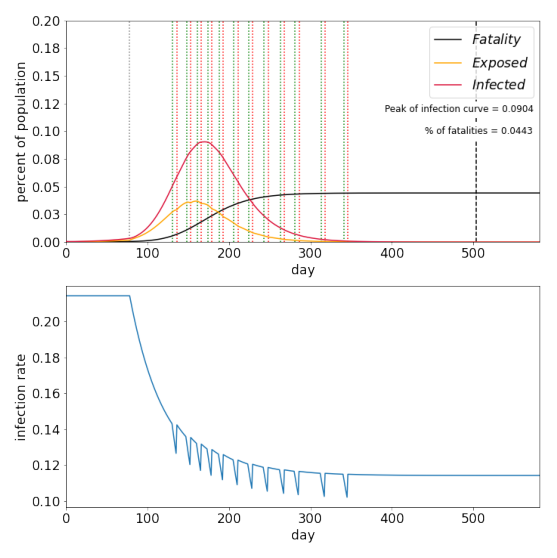

In [5]:
# population = pickle.load(open(f"ga_runs_final/run_0/qurantine_block_5_final_run_On_Decay/epoc_390.p", "rb"))
# img = plot_agent(population[0],params)
# plt.imshow(img.transpose(1, 2, 0))
# plt.axis('off')
# plt.savefig('fig/on_decay_5days_run0')

plt.figure()
population = pickle.load(open(f"ga_runs_final/run_0/qurantine_block_5_final_run_On_Off/epoc_390.p", "rb"))
img = plot_agent(population[0],params)
plt.imshow(img.transpose(1, 2, 0))
plt.axis('off')
plt.savefig('fig/on_decay_5days_run0')

/Users/javier/Desktop/Corona-Research/seirsplus/seirsplus/models.py:402: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(['{:,.0%}'.format(y) for y in ax.get_yticks()])
/Users/javier/Desktop/Corona-Research/seirsplus/seirsplus/models.py:402: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(['{:,.0%}'.format(y) for y in ax.get_yticks()])
/Users/javier/Desktop/Corona-Research/seirsplus/seirsplus/models.py:402: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(['{:,.0%}'.format(y) for y in ax.get_yticks()])
/Users/javier/Desktop/Corona-Research/seirsplus/seirsplus/models.py:402: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(['{:,.0%}'.format(y) for y in ax.get_yticks()])
/Users/javier/Desktop/Corona-Research/seirsplus/seirsplus/models.py:402: UserWarning: FixedFormatter should only be used together wi

/Users/javier/Desktop/Corona-Research/seirsplus/seirsplus/models.py:402: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(['{:,.0%}'.format(y) for y in ax.get_yticks()])
/Users/javier/Desktop/Corona-Research/seirsplus/seirsplus/models.py:402: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(['{:,.0%}'.format(y) for y in ax.get_yticks()])
/Users/javier/Desktop/Corona-Research/seirsplus/seirsplus/models.py:402: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(['{:,.0%}'.format(y) for y in ax.get_yticks()])
/Users/javier/Desktop/Corona-Research/seirsplus/seirsplus/models.py:402: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(['{:,.0%}'.format(y) for y in ax.get_yticks()])
/Users/javier/Desktop/Corona-Research/seirsplus/seirsplus/models.py:402: UserWarning: FixedFormatter should only be used together wi

/Users/javier/Desktop/Corona-Research/seirsplus/seirsplus/models.py:402: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(['{:,.0%}'.format(y) for y in ax.get_yticks()])
/Users/javier/Desktop/Corona-Research/seirsplus/seirsplus/models.py:402: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(['{:,.0%}'.format(y) for y in ax.get_yticks()])
/Users/javier/Desktop/Corona-Research/seirsplus/seirsplus/models.py:402: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(['{:,.0%}'.format(y) for y in ax.get_yticks()])
/Users/javier/Desktop/Corona-Research/seirsplus/seirsplus/models.py:402: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(['{:,.0%}'.format(y) for y in ax.get_yticks()])
/Users/javier/Desktop/Corona-Research/seirsplus/seirsplus/models.py:402: UserWarning: FixedFormatter should only be used together wi

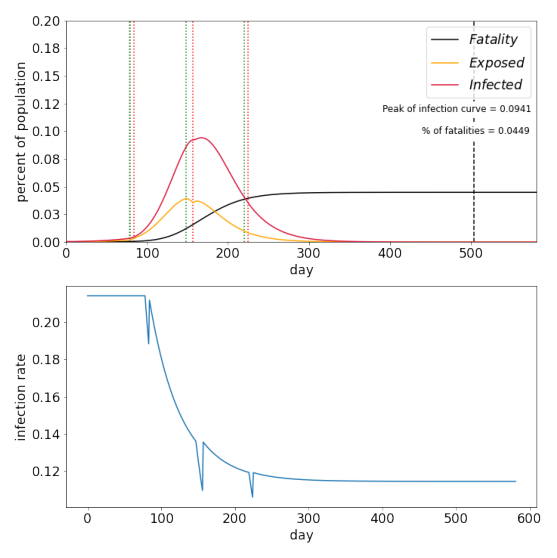

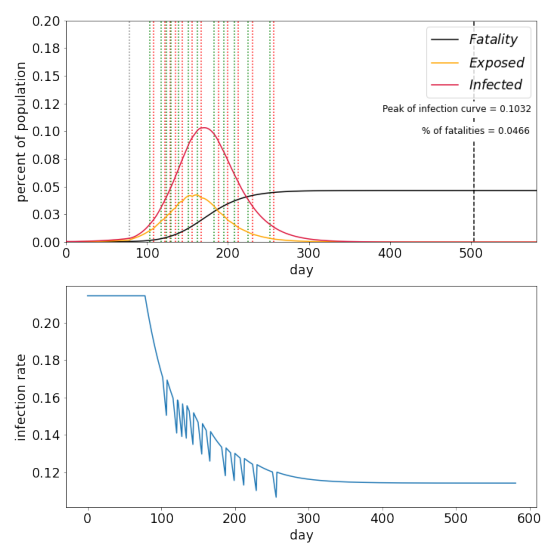

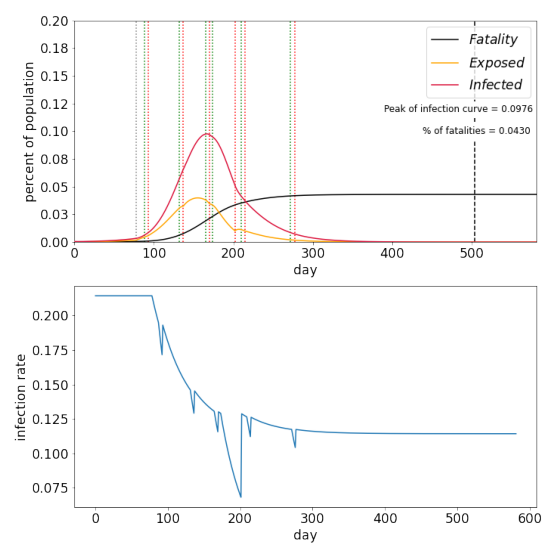

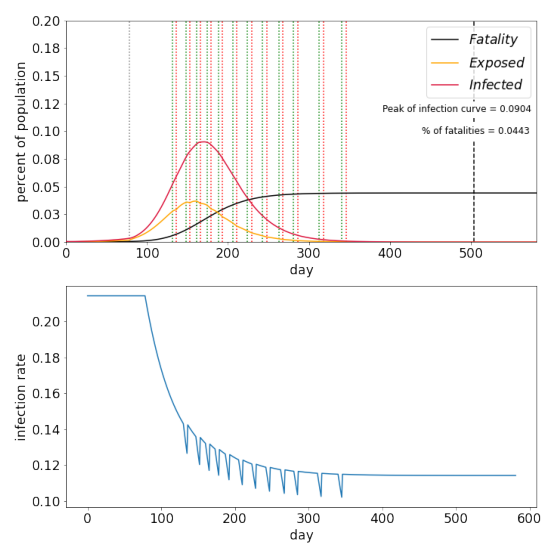

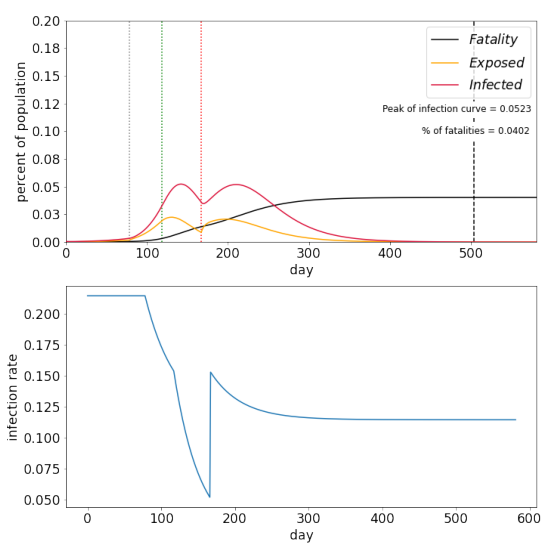

...

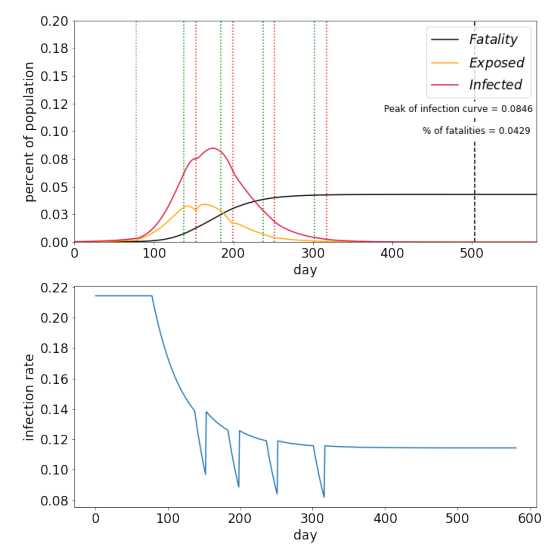

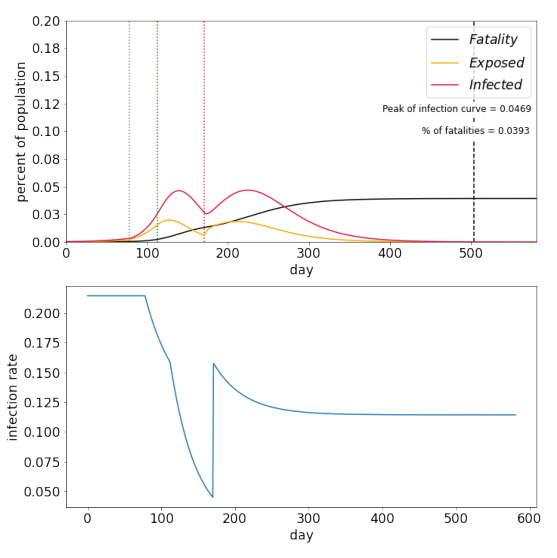

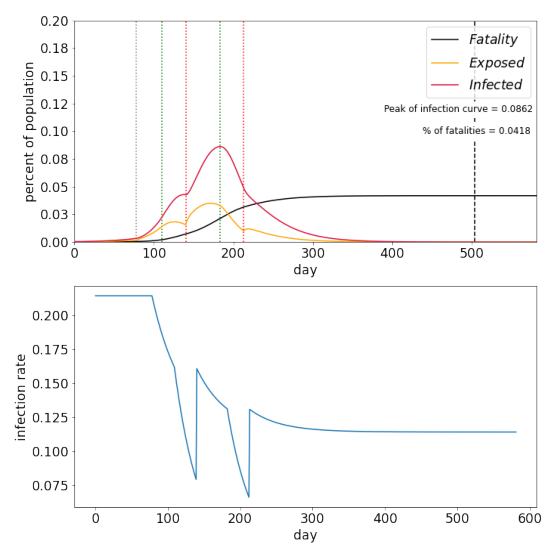

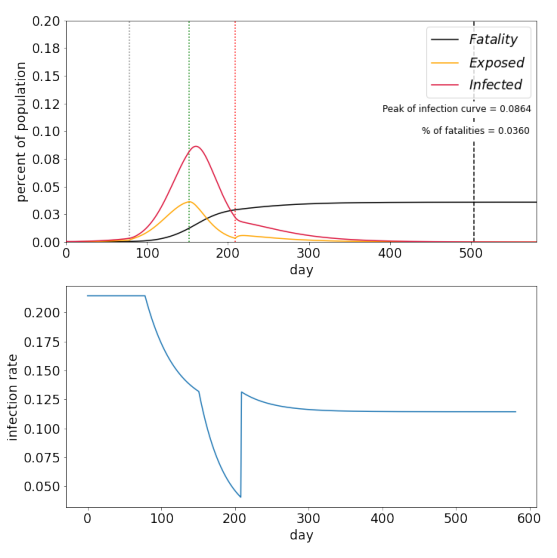

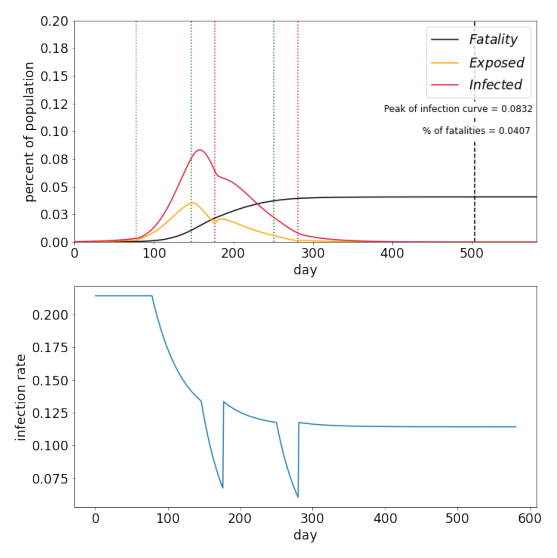

In [18]:
runs_s = [0, 1, 2, 3, 4]
quarantine_length_s = [5, 10, 15, 30]
types_quarantine_s = ['Decay_Decay', 'Decay_Off', 'On_Decay', 'On_Off']

for runs in runs_s:
    for quarantine_length in quarantine_length_s:
        for types_quarantine in types_quarantine_s:
            population = pickle.load(open(f"ga_runs_final/run_{runs}/qurantine_block_{quarantine_length}_final_run_{types_quarantine}/epoc_390.p", "rb"))

            img = plot_agent(population[0],params)
            plt.figure()
            plt.imshow(img.transpose(1, 2, 0))
            plt.axis('off')
            plt.savefig(f'fig/{types_quarantine}_{quarantine_length}days_run{runs}')

In [36]:
seirs_model, betas, is_lockdown = get_curve_stats(population[0], params)

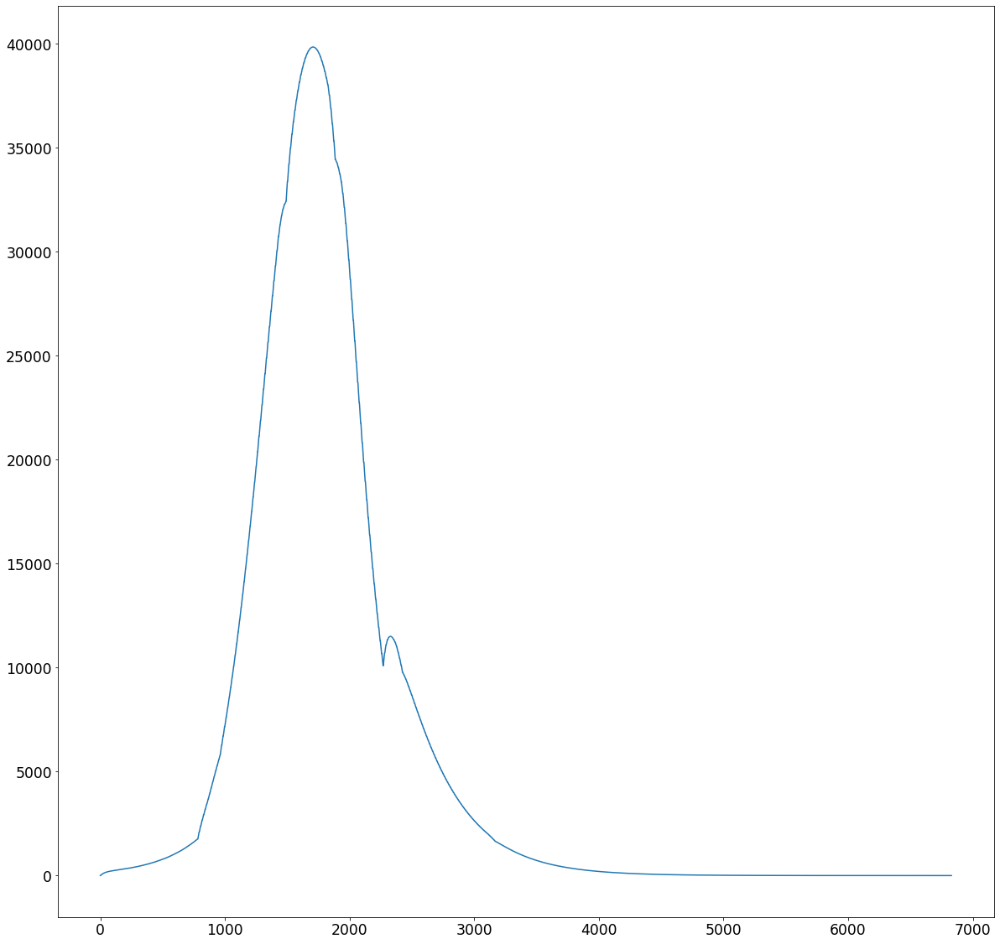

In [37]:
plt.plot(seirs_model.ref_model.numE)

/home/kaan/Corona-Research/seirsplus/seirsplus/models.py:402: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(['{:,.0%}'.format(y) for y in ax.get_yticks()])


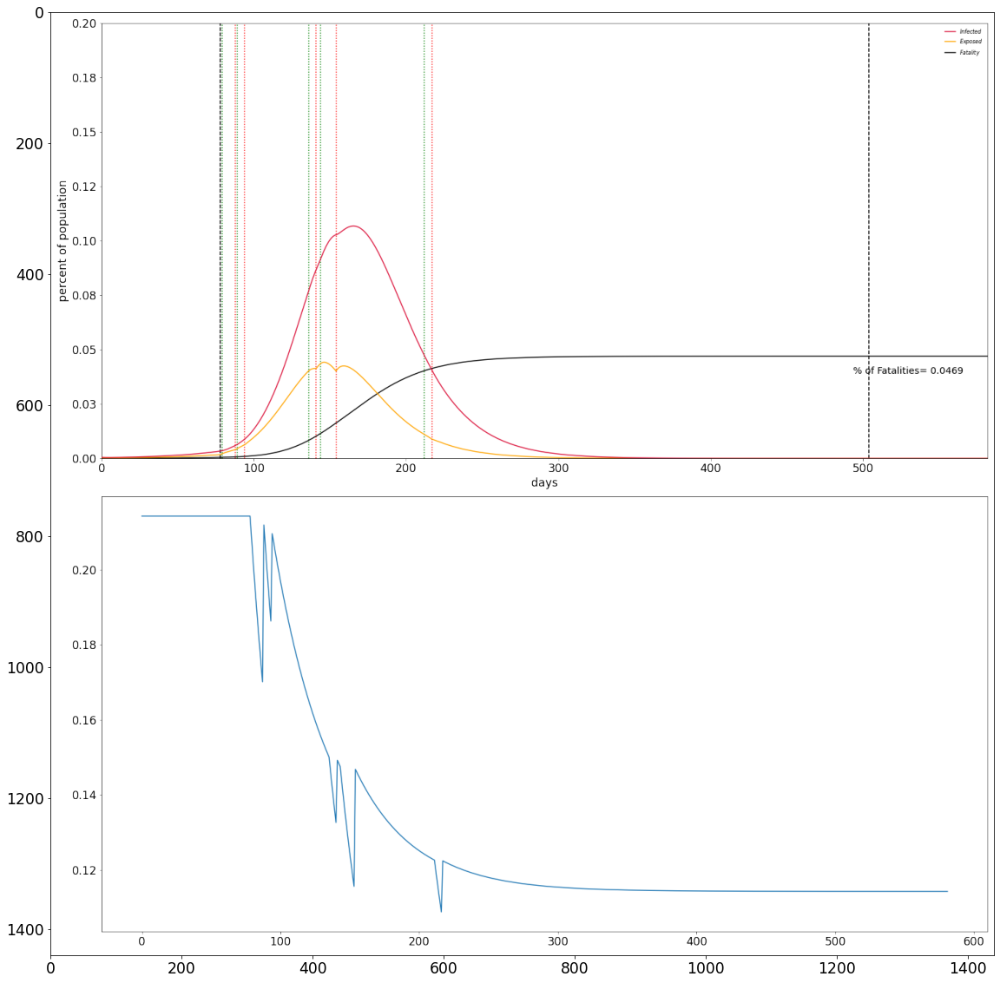

In [29]:
img = plot_agent(population[1],params)
plt.imshow(img.transpose(1,2,0))

#### Distribution of the population

In [10]:
umap_emb = UMAP(n_neighbors=200, min_dist=0.001, random_state=5)
fitted = umap_emb.fit_transform(stacked_pop.squeeze())
cmap = cm.get_cmap('magma')
colors = cmap(scores)
plt.figure(figsize=(20, 20), dpi=100)
for x, y, c in zip(fitted[:, 0], fitted[:, 1], colors):
    plt.scatter(x, y, c=[c], alpha=0.5)

plt.scatter(fitted[elite_indices, 0],
            fitted[elite_indices, 1],
            c="cyan",
            alpha=1)

NameError: name 'UMAP' is not defined

### Analysis between the lockdown blocks

In [ ]:
list_of_all_quarantine_blocks = [5, 15, 30]
list_of_all_models = ["GA_saved_models/ga_5_min_new_2_5elite"] + [
    "GA_saved_models/ga_15_min_new_1_5elites"
] + ["GA_saved_models/ga_30_min_new_1_5elite"]
max_ind = []
indices = []
all_solutions = []
all_scores = []

try:
    pooling.close()
except:
    pass

pooling = Pool(5)

for i, model in tqdm(enumerate(list_of_all_models)):
    population = pickle.load(open(model, "rb"))
    new_pop = []
    for elem in population:
        new_pop.append(elem[0])
    stacked_pop = torch.stack(new_pop)

    ret = np.array(get_lockdowns(stacked_pop,
                                 list_of_all_quarantine_blocks[i]))
    lockdowns, scores = ret[:, 0], ret[:, 1]
    scores = np.array(scores)
    scores = (scores - scores.min()) / (scores.max() - scores.min())
    max_ind.extend((-scores).argsort()[:10])
    all_solutions.extend(lockdowns)
    all_scores.extend(scores)
    indices.extend(list(np.ones(len(population)) * i))

pooling.close()

In [ ]:
peaks = [np.max(elem) for elem in all_solutions]
sols = np.array(all_solutions)
scrs = np.array(all_scores) / 2
max_inds = np.array(max_ind)

In [ ]:
umap_emb = UMAP(n_components=2, n_neighbors=15, min_dist=1, random_state=5)
fitted = umap_emb.fit_transform(sols)

### Visulation of Solutions

In [ ]:
cmap = cm.get_cmap('tab20b')
colors_ = ["red", "blue", "cyan", "black", "green", "gold", "silver"]
past_indice = None
counter = 0
fig, ax = plt.subplots(1, 1, figsize=(20, 20), dpi=100)
for x, y, i in zip(fitted[:, 0], fitted[:, 1], indices):
    i = int(i)
    color = colors_[i]
    if not i == past_indice:
        past_indice = i
        ax.scatter(x,
                   y,
                   c=[color],
                   alpha=scrs[counter],
                   label="Min Lockdown Duration: " +
                   str(list_of_all_quarantine_blocks[i]))
    else:
        ax.scatter(x, y, c=[color], alpha=scrs[counter])
    counter += 1

    if i == 1 and counter == 150:
        ax.scatter(x, y, c=["gold"], alpha=scrs[counter])

past_indice = None
for count, max_i in enumerate(max_inds):
    i = int(max_i + int((count) / 10) * 200)
    x, y = fitted[i]
    color = colors_[int(indices[i]) + 3]
    if not int(indices[i]) == past_indice:
        past_indice = int(indices[i])
        ax.scatter(x,
                   y,
                   c=[color],
                   alpha=1.0,
                   s=50,
                   label="Best solutions of: " +
                   str(list_of_all_quarantine_blocks[int(indices[i])]))
    else:
        ax.scatter(x, y, c=[color], alpha=1.0, s=50)

ax.set_xlabel("UMAP Component 1")
ax.set_ylabel("UMAP Component 2")
ax.legend(fontsize="xx-large")
plt.savefig('fig/umap_ga')

### Analysis

In [ ]:
fig, bx = plt.subplots(1, 1, figsize=(20, 20), dpi=100)
plot_names = [
    str(list_of_all_quarantine_blocks[int(i)]) + " days" for i in indices
]

df = pd.DataFrame()

order = ['5 days', '15 days', '30 days']
df["Minimum Lockdown Duration"] = plot_names
df["Peak Value of the Infected Curve"] = peaks
sns.boxplot(ax=bx,
            x="Minimum Lockdown Duration",
            y="Peak Value of the Infected Curve",
            data=df)

add_stat_annotation(bx,
                    data=df,
                    x="Minimum Lockdown Duration",
                    y="Peak Value of the Infected Curve",
                    order=order,
                    box_pairs=[("5 days", "30 days")],
                    line_offset=0.10,
                    test='t-test_ind',
                    text_format='star',
                    loc='outside',
                    verbose=2)
add_stat_annotation(bx,
                    data=df,
                    x="Minimum Lockdown Duration",
                    y="Peak Value of the Infected Curve",
                    order=order,
                    box_pairs=[("5 days", "15 days")],
                    line_offset=0.0,
                    test='t-test_ind',
                    text_format='star',
                    loc='outside',
                    verbose=2)
add_stat_annotation(bx,
                    data=df,
                    x="Minimum Lockdown Duration",
                    y="Peak Value of the Infected Curve",
                    order=order,
                    box_pairs=[("15 days", "30 days")],
                    line_offset=0.05,
                    test='t-test_ind',
                    text_format='star',
                    loc='outside',
                    verbose=2)
plt.savefig('fig/boxplot_ga')